<b> Coursera Capstone Notebook <b>

    
 To be used for the coursera applied data science capstone project using Foursquare API Geo Data

In [1]:
import pandas as pd
import numpy as np
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [2]:
print("Hello Capstone Project Course!")

Hello Capstone Project Course!


## Introduction / Business Problem

Using the Toronto API Data from Foursquare Inc, we will be looking at the borough of Downtown Toronto (or any other desired borough)

The problem: As a bustling city, Downtown Toronto is full of places and things to see. As a tourist or a new resident, it can be overwhelming very quickly. Using this foursquare API data along with borough and the neighbourhood we are in, we can determine the most common types of venues and their exact location on a map
Trying to determine:
1. Determine the most common type of venue in downtown Toronto
2. Determine what is the most common type of cuisine in Downtown Toronto based on neighbour

# Target Population

New residents and tourists of Toronto, Canada
Traveling business people looking to find the types of food and venues near them

## Data Section

Data: https://en.wikipedia.org/wiki/List_of_postal_codes_of_Canada:_M
Foursquare API Developer Data
Focus on Downtown Toronto

This data will be used to solve the problem of determining the most common types of venue(s) in downtown Toronto, and based on the borough and location can find, the type of venue most common for that area

# Scraping Web Data from Wikipedia, Part I

In [3]:
url = 'https://en.wikipedia.org/wiki/List_of_postal_codes_of_Canada:_M,'

In [4]:
import requests
import lxml.html as lh
import bs4 as bs
from bs4 import BeautifulSoup
import urllib.request

In [5]:
url = "https://en.wikipedia.org/wiki/List_of_postal_codes_of_Canada:_M"
data = requests.get(url).text
soup = bs.BeautifulSoup(data,'lxml')
tables = soup.find_all('table')[0]
df = pd.read_html(str(tables))
canada_data = pd.read_json(df[0].to_json(orient='records'))
canada_data.head()

,Postal Code,Borough,Neighbourhood
0,M1A,Not assigned,Not assigned
1,M2A,Not assigned,Not assigned
2,M3A,North York,Parkwoods
3,M4A,North York,Victoria Village
4,M5A,Downtown Toronto,"Regent Park, Harbourfront"


In [6]:
canada_selected = canada_data[canada_data['Borough'] != 'Not assigned']
canada_selected = canada_selected.groupby(['Borough', 'Postal Code'], as_index=False).agg(','.join)
canada_selected

,Borough,Postal Code,Neighbourhood
0,Central Toronto,M4N,Lawrence Park
1,Central Toronto,M4P,Davisville North
2,Central Toronto,M4R,"North Toronto West, Lawrence Park"
3,Central Toronto,M4S,Davisville
4,Central Toronto,M4T,"Moore Park, Summerhill East"
5,Central Toronto,M4V,"Summerhill West, Rathnelly, South Hill, Forest..."
6,Central Toronto,M5N,Roselawn
7,Central Toronto,M5P,"Forest Hill North & West, Forest Hill Road Park"
8,Central Toronto,M5R,"The Annex, North Midtown, Yorkville"
9,Downtown Toronto,M4W,Rosedale


In [7]:
canada_selected['Neighbourhood'] = np.where(canada_selected['Neighbourhood'] == 'Not assigned', canada_selected['Borough'], canada_selected['Neighbourhood'])
canada_selected.shape

(103, 3)

# Part II

In [8]:
geo_url = "https://cocl.us/Geospatial_data"
geo_data = pd.read_csv(geo_url)
geo_data.head()

,Postal Code,Latitude,Longitude
0,M1B,43.806686,-79.194353
1,M1C,43.784535,-79.160497
2,M1E,43.763573,-79.188711
3,M1G,43.770992,-79.216917
4,M1H,43.773136,-79.239476


In [9]:
geo_data.columns

Index(['Postal Code', 'Latitude', 'Longitude'], dtype='object')

In [10]:
can_geo_data = pd.merge(canada_selected, geo_data, on='Postal Code')
can_geo_data

,Borough,Postal Code,Neighbourhood,Latitude,Longitude
0,Central Toronto,M4N,Lawrence Park,43.728020,-79.388790
1,Central Toronto,M4P,Davisville North,43.712751,-79.390197
2,Central Toronto,M4R,"North Toronto West, Lawrence Park",43.715383,-79.405678
3,Central Toronto,M4S,Davisville,43.704324,-79.388790
4,Central Toronto,M4T,"Moore Park, Summerhill East",43.689574,-79.383160
5,Central Toronto,M4V,"Summerhill West, Rathnelly, South Hill, Forest...",43.686412,-79.400049
6,Central Toronto,M5N,Roselawn,43.711695,-79.416936
7,Central Toronto,M5P,"Forest Hill North & West, Forest Hill Road Park",43.696948,-79.411307
8,Central Toronto,M5R,"The Annex, North Midtown, Yorkville",43.672710,-79.405678
9,Downtown Toronto,M4W,Rosedale,43.679563,-79.377529


# Part III

In [11]:
!pip install folium

import numpy as np # library to handle data in a vectorized manner

import pandas as pd # library for data analsysis
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

import json # library to handle JSON files

#!conda install -c conda-forge geopy --yes
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors

# import k-means from clustering stage
from sklearn.cluster import KMeans

#!conda install -c conda-forge folium=0.5.0 --yes
import folium # map rendering library

print('Libraries imported.')

Libraries imported.


In [12]:
## Hidden Foursquare API Data Cell
#@hidden_cell
CLIENT_ID = 'DNYLFAP3YCUUJABVJLXVHDDWXJAV5QJYQGI525L0YK2X5JFV' # my Foursquare ID
CLIENT_SECRET = 'SAV0YNZNV10APNLQKZUUTOYK1JYVPE4XOVZHTS24XVTTKAVA' # my Foursquare Secret
VERSION = '20180604'
LIMIT = 30
print('Your credentails:')
print('CLIENT_ID: '+CLIENT_ID)
print('CLIENT_SECRET: '+CLIENT_SECRET)

Your credentails:
CLIENT_ID: DNYLFAP3YCUUJABVJLXVHDDWXJAV5QJYQGI525L0YK2X5JFV
CLIENT_SECRET: SAV0YNZNV10APNLQKZUUTOYK1JYVPE4XOVZHTS24XVTTKAVA


In [13]:
address = 'Toronto, CA'

geolocator = Nominatim(user_agent="toronto_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of Toronto are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of Toronto are 43.6534817, -79.3839347.


In [14]:
# create map of Toronto using latitude and longitude values
map_toronto = folium.Map(location=[latitude, longitude], zoom_start=10)

# add markers to map
for lat, lng, borough, neighbourhood in zip(can_geo_data['Latitude'], can_geo_data['Longitude'], can_geo_data['Borough'], can_geo_data['Neighbourhood']):
    label = '{}, {}'.format(neighbourhood, borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_toronto)  
    
map_toronto

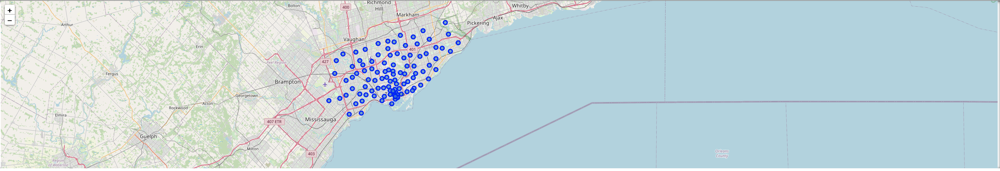

In [15]:
downtown_toronto_data = can_geo_data[can_geo_data['Borough'] == 'Downtown Toronto'].reset_index(drop=True)
downtown_toronto_data

,Borough,Postal Code,Neighbourhood,Latitude,Longitude
0,Downtown Toronto,M4W,Rosedale,43.679563,-79.377529
1,Downtown Toronto,M4X,"St. James Town, Cabbagetown",43.667967,-79.367675
2,Downtown Toronto,M4Y,Church and Wellesley,43.665860,-79.383160
3,Downtown Toronto,M5A,"Regent Park, Harbourfront",43.654260,-79.360636
4,Downtown Toronto,M5B,"Garden District, Ryerson",43.657162,-79.378937
5,Downtown Toronto,M5C,St. James Town,43.651494,-79.375418
6,Downtown Toronto,M5E,Berczy Park,43.644771,-79.373306
7,Downtown Toronto,M5G,Central Bay Street,43.657952,-79.387383
8,Downtown Toronto,M5H,"Richmond, Adelaide, King",43.650571,-79.384568
9,Downtown Toronto,M5J,"Harbourfront East, Union Station, Toronto Islands",43.640816,-79.381752


In [16]:
address = 'Downtown Toronto, Toronto'

geolocator = Nominatim(user_agent="downtown_toronto_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of Downtown Toronto are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of Downtown Toronto are 43.6541737, -79.38081164513409.


In [17]:
# create map of Downtown Toronto using latitude and longitude values
map_downtown_toronto = folium.Map(location=[latitude, longitude], zoom_start=11)

# add markers to map
for lat, lng, label in zip(downtown_toronto_data['Latitude'], downtown_toronto_data['Longitude'], downtown_toronto_data['Neighbourhood']):
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_downtown_toronto)  
    
map_downtown_toronto

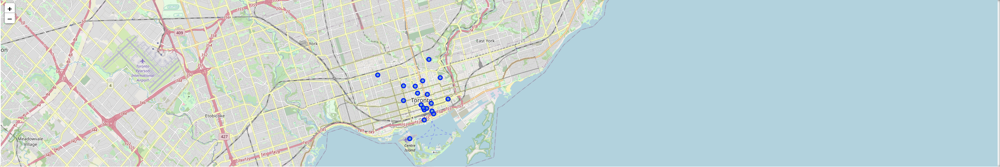

In [18]:
can_geo_data.loc[0, 'Neighbourhood']

'Lawrence Park'

In [19]:
downtown_toronto_data.loc[0, 'Neighbourhood']

'Rosedale'

In [20]:
neighbourhood_latitude = downtown_toronto_data.loc[0, 'Latitude'] # neighborhood latitude value
neighbourhood_longitude = downtown_toronto_data.loc[0, 'Longitude'] # neighborhood longitude value

neighbourhood_name = downtown_toronto_data.loc[0, 'Neighbourhood'] # neighbourhood name

print('Latitude and longitude values of {} are {}, {}.'.format(neighbourhood_name, 
                                                               neighbourhood_latitude, 
                                                               neighbourhood_longitude))

Latitude and longitude values of Rosedale are 43.6795626, -79.37752940000001.


In [21]:
LIMIT = 100 # limit of number of venues returned by Foursquare API


radius = 500 # define radius



url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
    CLIENT_ID, 
    CLIENT_SECRET, 
    VERSION, 
    neighbourhood_latitude, 
    neighbourhood_longitude, 
    radius, 
    LIMIT)
url # display URL

'https://api.foursquare.com/v2/venues/explore?&client_id=DNYLFAP3YCUUJABVJLXVHDDWXJAV5QJYQGI525L0YK2X5JFV&client_secret=SAV0YNZNV10APNLQKZUUTOYK1JYVPE4XOVZHTS24XVTTKAVA&v=20180604&ll=43.6795626,-79.37752940000001&radius=500&limit=100'

In [22]:
results = requests.get(url).json()
results

{'meta': {'code': 200, 'requestId': '604a2eac62d9b434d7aa130b'},
 'response': {'headerLocation': 'Rosedale',
  'headerFullLocation': 'Rosedale, Toronto',
  'headerLocationGranularity': 'neighborhood',
  'totalResults': 4,
  'suggestedBounds': {'ne': {'lat': 43.6840626045, 'lng': -79.37131878274371},
   'sw': {'lat': 43.675062595499995, 'lng': -79.38374001725632}},
  'groups': [{'type': 'Recommended Places',
    'name': 'recommended',
    'items': [{'reasons': {'count': 0,
       'items': [{'summary': 'This spot is popular',
         'type': 'general',
         'reasonName': 'globalInteractionReason'}]},
      'venue': {'id': '4aff2d47f964a520743522e3',
       'name': 'Rosedale Park',
       'location': {'address': '38 Scholfield Ave.',
        'crossStreet': 'at Edgar Ave.',
        'lat': 43.68232820227814,
        'lng': -79.37893434347683,
        'labeledLatLngs': [{'label': 'display',
          'lat': 43.68232820227814,
          'lng': -79.37893434347683}],
        'distance': 32

In [23]:
# function that extracts the category of the venue
def get_category_type(row):
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']

In [24]:
venues = results['response']['groups'][0]['items']
    
nearby_venues = json_normalize(venues) # flatten JSON

# filter columns
filtered_columns = ['venue.name', 'venue.categories', 'venue.location.lat', 'venue.location.lng']
nearby_venues =nearby_venues.loc[:, filtered_columns]

# filter the category for each row
nearby_venues['venue.categories'] = nearby_venues.apply(get_category_type, axis=1)

# clean columns
nearby_venues.columns = [col.split(".")[-1] for col in nearby_venues.columns]

nearby_venues


/opt/conda/envs/Python-3.7-main/lib/python3.7/site-packages/ipykernel/__main__.py:3: FutureWarning: pandas.io.json.json_normalize is deprecated, use pandas.json_normalize instead
  app.launch_new_instance()


,name,categories,lat,lng
0,Rosedale Park,Playground,43.682328,-79.378934
1,Whitney Park,Park,43.682036,-79.373788
2,Alex Murray Parkette,Park,43.678300,-79.382773
3,Milkman's Lane,Trail,43.676352,-79.373842


In [25]:
print('{} venues were returned by Foursquare.'.format(nearby_venues.shape[0]))

4 venues were returned by Foursquare.


In [26]:
def getNearbyVenues(names, latitudes, longitudes, radius=500):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [27]:
downtown_toronto_venues = getNearbyVenues(names=downtown_toronto_data['Neighbourhood'],
                                   latitudes=downtown_toronto_data['Latitude'],
                                   longitudes=downtown_toronto_data['Longitude'])

Rosedale
St. James Town, Cabbagetown
Church and Wellesley
Regent Park, Harbourfront
Garden District, Ryerson
St. James Town
Berczy Park
Central Bay Street
Richmond, Adelaide, King
Harbourfront East, Union Station, Toronto Islands
Toronto Dominion Centre, Design Exchange
Commerce Court, Victoria Hotel
University of Toronto, Harbord
Kensington Market, Chinatown, Grange Park
CN Tower, King and Spadina, Railway Lands, Harbourfront West, Bathurst Quay, South Niagara, Island airport
Stn A PO Boxes
First Canadian Place, Underground city
Christie
Queen's Park, Ontario Provincial Government


In [28]:
print(downtown_toronto_venues.shape)
downtown_toronto_venues

(1223, 7)


,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Rosedale,43.679563,-79.377529,Rosedale Park,43.682328,-79.378934,Playground
1,Rosedale,43.679563,-79.377529,Whitney Park,43.682036,-79.373788,Park
2,Rosedale,43.679563,-79.377529,Alex Murray Parkette,43.678300,-79.382773,Park
3,Rosedale,43.679563,-79.377529,Milkman's Lane,43.676352,-79.373842,Trail
4,"St. James Town, Cabbagetown",43.667967,-79.367675,Cranberries,43.667843,-79.369407,Diner
5,"St. James Town, Cabbagetown",43.667967,-79.367675,Kingyo Toronto,43.665895,-79.368415,Japanese Restaurant
6,"St. James Town, Cabbagetown",43.667967,-79.367675,Murgatroid,43.667381,-79.369311,Restaurant
7,"St. James Town, Cabbagetown",43.667967,-79.367675,F'Amelia,43.667536,-79.368613,Italian Restaurant
8,"St. James Town, Cabbagetown",43.667967,-79.367675,Merryberry Cafe + Bistro,43.666630,-79.368792,Café
9,"St. James Town, Cabbagetown",43.667967,-79.367675,Cabbagetown Brew,43.666923,-79.369289,Café


In [29]:
downtown_toronto_venues.groupby('Neighborhood').count()

,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
Neighborhood,,,,,,
Berczy Park,61,61,61,61,61,61
"CN Tower, King and Spadina, Railway Lands, Harbourfront West, Bathurst Quay, South Niagara, Island airport",15,15,15,15,15,15
Central Bay Street,61,61,61,61,61,61
Christie,16,16,16,16,16,16
Church and Wellesley,76,76,76,76,76,76
"Commerce Court, Victoria Hotel",100,100,100,100,100,100
"First Canadian Place, Underground city",100,100,100,100,100,100
"Garden District, Ryerson",100,100,100,100,100,100
"Harbourfront East, Union Station, Toronto Islands",100,100,100,100,100,100


In [30]:
print('There are {} uniques categories.'.format(len(downtown_toronto_venues['Venue Category'].unique())))

There are 209 uniques categories.


In [31]:
# one hot encoding
downtown_toronto_onehot = pd.get_dummies(downtown_toronto_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
downtown_toronto_onehot['Neighborhood'] = downtown_toronto_venues['Neighborhood'] 

# move neighborhood column to the first column
fixed_columns = [downtown_toronto_onehot.columns[-1]] + list(downtown_toronto_onehot.columns[:-1])
downtown_toronto_onehot = downtown_toronto_onehot[fixed_columns]

downtown_toronto_onehot

,Yoga Studio,Airport,Airport Food Court,Airport Gate,Airport Lounge,Airport Service,Airport Terminal,American Restaurant,Antique Shop,Aquarium,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Stadium,Basketball Stadium,Beach,Bed & Breakfast,Beer Bar,Beer Store,Belgian Restaurant,Bistro,Boat or Ferry,Bookstore,Boutique,Brazilian Restaurant,Breakfast Spot,Brewery,Bubble Tea Shop,Burger Joint,Burrito Place,Butcher,Café,Candy Store,Caribbean Restaurant,Cheese Shop,Chinese Restaurant,Chocolate Shop,Church,Clothing Store,Cocktail Bar,Coffee Shop,College Arts Building,College Auditorium,College Gym,College Rec Center,Colombian Restaurant,Comfort Food Restaurant,Comic Shop,Concert Hall,Convenience Store,Cosmetics Shop,Creperie,Cupcake Shop,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Diner,Discount Store,Distribution Center,Dog Run,Doner Restaurant,Donut Shop,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,Escape Room,Ethiopian Restaurant,Event Space,Falafel Restaurant,Farmers Market,Fast Food Restaurant,Filipino Restaurant,Fish Market,Food & Drink Shop,Food Court,Food Truck,Fountain,French Restaurant,Fried Chicken Joint,Furniture / Home Store,Gaming Cafe,Garden,Gas Station,Gastropub,Gay Bar,General Entertainment,General Travel,German Restaurant,Gift Shop,Gluten-free Restaurant,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Harbor / Marina,Health & Beauty Service,Health Food Store,Historic Site,History Museum,Hookah Bar,Hospital,Hostel,Hotel,Hotel Bar,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Korean Restaurant,Lake,Latin American Restaurant,Lingerie Store,Liquor Store,Lounge,Market,Martial Arts School,Massage Studio,Mediterranean Restaurant,Men's Store,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Modern European Restaurant,Molecular Gastronomy Restaurant,Monument / Landmark,Moroccan Restaurant,Movie Theater,Museum,Music Venue,Neighborhood,New American Restaurant,Nightclub,Noodle House,Office,Opera House,Optical Shop,Organic Grocery,Other Great Outdoors,Park,Performing Arts Venue,Pet Store,Pharmacy,Pizza Place,Plane,Playground,Plaza,Poke Place,Portuguese Restaurant,Poutine Place,Pub,Ramen Restaurant,Record Shop,Rental Car Location,Restaurant,Roof Deck,Sake Bar,Salad Place,Salon / Barbershop,Sandwich Place,Scenic Lookout,Sculpture Garden,Seafood Restaurant,Shoe Store,Shopping Mall,Skating Rink,Smoke Shop,Smoothie Shop,Snack Place,Soup Place,Spa,Speakeasy,Sporting Goods Shop,Sports Bar,Steakhouse,Strip Club,Supermarket,Sushi Restaurant,Taco Place,Tailor Shop,Taiwanese Restaurant,Tanning Salon,Tea Room,Thai Restaurant,Theater,Theme Restaurant,Thrift / Vintage Store,Trail,Train Station,Vegetarian / Vegan Restaurant,Video Game Store,Vietnamese Restaurant,Wine Bar,Women's Store
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Rosedale,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Rosedale,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,

In [32]:
downtown_toronto_grouped = downtown_toronto_onehot.groupby('Neighborhood').mean().reset_index()
downtown_toronto_grouped

,Neighborhood,Yoga Studio,Airport,Airport Food Court,Airport Gate,Airport Lounge,Airport Service,Airport Terminal,American Restaurant,Antique Shop,Aquarium,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Stadium,Basketball Stadium,Beach,Bed & Breakfast,Beer Bar,Beer Store,Belgian Restaurant,Bistro,Boat or Ferry,Bookstore,Boutique,Brazilian Restaurant,Breakfast Spot,Brewery,Bubble Tea Shop,Burger Joint,Burrito Place,Butcher,Café,Candy Store,Caribbean Restaurant,Cheese Shop,Chinese Restaurant,Chocolate Shop,Church,Clothing Store,Cocktail Bar,Coffee Shop,College Arts Building,College Auditorium,College Gym,College Rec Center,Colombian Restaurant,Comfort Food Restaurant,Comic Shop,Concert Hall,Convenience Store,Cosmetics Shop,Creperie,Cupcake Shop,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Diner,Discount Store,Distribution Center,Dog Run,Doner Restaurant,Donut Shop,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,Escape Room,Ethiopian Restaurant,Event Space,Falafel Restaurant,Farmers Market,Fast Food Restaurant,Filipino Restaurant,Fish Market,Food & Drink Shop,Food Court,Food Truck,Fountain,French Restaurant,Fried Chicken Joint,Furniture / Home Store,Gaming Cafe,Garden,Gas Station,Gastropub,Gay Bar,General Entertainment,General Travel,German Restaurant,Gift Shop,Gluten-free Restaurant,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Harbor / Marina,Health & Beauty Service,Health Food Store,Historic Site,History Museum,Hookah Bar,Hospital,Hostel,Hotel,Hotel Bar,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Korean Restaurant,Lake,Latin American Restaurant,Lingerie Store,Liquor Store,Lounge,Market,Martial Arts School,Massage Studio,Mediterranean Restaurant,Men's Store,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Modern European Restaurant,Molecular Gastronomy Restaurant,Monument / Landmark,Moroccan Restaurant,Movie Theater,Museum,Music Venue,New American Restaurant,Nightclub,Noodle House,Office,Opera House,Optical Shop,Organic Grocery,Other Great Outdoors,Park,Performing Arts Venue,Pet Store,Pharmacy,Pizza Place,Plane,Playground,Plaza,Poke Place,Portuguese Restaurant,Poutine Place,Pub,Ramen Restaurant,Record Shop,Rental Car Location,Restaurant,Roof Deck,Sake Bar,Salad Place,Salon / Barbershop,Sandwich Place,Scenic Lookout,Sculpture Garden,Seafood Restaurant,Shoe Store,Shopping Mall,Skating Rink,Smoke Shop,Smoothie Shop,Snack Place,Soup Place,Spa,Speakeasy,Sporting Goods Shop,Sports Bar,Steakhouse,Strip Club,Supermarket,Sushi Restaurant,Taco Place,Tailor Shop,Taiwanese Restaurant,Tanning Salon,Tea Room,Thai Restaurant,Theater,Theme Restaurant,Thrift / Vintage Store,Trail,Train Station,Vegetarian / Vegan Restaurant,Video Game Store,Vietnamese Restaurant,Wine Bar,Women's Store
0,Berczy Park,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.016393,0.000000,0.000000,0.000000,0.0000,0.000000,0.0000,0.016393,0.049180,0.000000,0.000000,0.00,0.016393,0.016393,0.000000,0.032787,0.000000,0.000000,0.016393,0.000000,0.000000,0.000000,0.000000,0.016393,0.000000,0.000000,0.000000,0.000000,0.000000,0.016393,0.0000,0.000000,0.032787,0.000000,0.000000,0.00,0.016393,0.049180,0.081967,0.000000,0.000000,0.000000,0.00,0.000000,0.016393,0.000000,0.016393,0.000000,0.000000,0.016393,0.000000,0.000000,0.000000,0.016393,0.000000,0.016393,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.016393,0.000000,0.000000,0.00,0.000000,0.000000,0.032787,0.000000,0.000000,0.016393,0.000000,0.000000,0.000000,0.016393,0.016393,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.016393,0.016393,0.016393,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.00,0.000000,0.00,0.016393,0.000000,0.00,0.000000,0.000000,0.00,0.

In [33]:
num_top_venues = 5

for hood in downtown_toronto_grouped['Neighborhood']:
    print("----"+hood+"----")
    temp = downtown_toronto_grouped[downtown_toronto_grouped['Neighborhood'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

----Berczy Park----
          venue  freq
0   Coffee Shop  0.08
1        Bakery  0.05
2  Cocktail Bar  0.05
3    Restaurant  0.03
4      Pharmacy  0.03


----CN Tower, King and Spadina, Railway Lands, Harbourfront West, Bathurst Quay, South Niagara, Island airport----
              venue  freq
0    Airport Lounge  0.13
1   Airport Service  0.13
2  Airport Terminal  0.13
3   Harbor / Marina  0.07
4           Airport  0.07


----Central Bay Street----
                venue  freq
0         Coffee Shop  0.18
1  Italian Restaurant  0.07
2                Café  0.05
3      Sandwich Place  0.05
4     Bubble Tea Shop  0.03


----Christie----
           venue  freq
0  Grocery Store  0.25
1           Café  0.19
2           Park  0.12
3     Restaurant  0.06
4      Nightclub  0.06


----Church and Wellesley----
                 venue  freq
0          Coffee Shop  0.08
1     Sushi Restaurant  0.07
2  Japanese Restaurant  0.07
3           Restaurant  0.04
4              Gay Bar  0.04


----Commerce C

In [34]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

In [35]:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighborhoods_venues_sorted = pd.DataFrame(columns=columns)
neighborhoods_venues_sorted['Neighborhood'] = downtown_toronto_grouped['Neighborhood']

for ind in np.arange(downtown_toronto_grouped.shape[0]):
    neighborhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(downtown_toronto_grouped.iloc[ind, :], num_top_venues)

neighborhoods_venues_sorted

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Berczy Park,Coffee Shop,Cocktail Bar,Bakery,Cheese Shop,Seafood Restaurant,Beer Bar,Restaurant,Pharmacy,Farmers Market,Japanese Restaurant
1,"CN Tower, King and Spadina, Railway Lands, Har...",Airport Lounge,Airport Service,Airport Terminal,Boutique,Airport,Airport Food Court,Airport Gate,Sculpture Garden,Harbor / Marina,Boat or Ferry
2,Central Bay Street,Coffee Shop,Italian Restaurant,Café,Sandwich Place,Salad Place,Thai Restaurant,Burger Joint,Bubble Tea Shop,Japanese Restaurant,Portuguese Restaurant
3,Christie,Grocery Store,Café,Park,Athletics & Sports,Candy Store,Italian Restaurant,Restaurant,Baby Store,Coffee Shop,Nightclub
4,Church and Wellesley,Coffee Shop,Japanese Restaurant,Sushi Restaurant,Restaurant,Gay Bar,Hotel,Pub,Café,Men's Store,Mediterranean Restaurant
5,"Commerce Court, Victoria Hotel",Coffee Shop,Restaurant,Hotel,Café,Gym,Italian Restaurant,Cocktail Bar,Seafood Restaurant,Japanese Restaurant,Deli / Bodega
6,"First Canadian Place, Underground city",Coffee Shop,Café,Restaurant,Hotel,Gym,Japanese Restaurant,Salad Place,Seafood Restaurant,Asian Restaurant,Steakhouse
7,"Garden District, Ryerson",Clothing Store,Coffee Shop,Bubble Tea Shop,Middle Eastern Restaurant,Japanese Restaurant,Italian Restaurant,Cosmetics Shop,Hotel,Café,Theater
8,"Harbourfront East, Union Station, Toronto Islands",Coffee Shop,Aquarium,Hotel,Café,Brewery,Restaurant,Fried Chicken Joint,Italian Restaurant,Scenic Lookout,Sporting Goods Shop
9,"Kensington Market, Chinatown, Grange Park",Café,Coffee Shop,Vietnamese Restaurant,Mexican Restaurant,Vegetarian / Vegan Restaurant,Bar,Grocery Store,Burger Joint,Park,Farmers Market


In [36]:
# set number of clusters
kclusters = 5
downtown_toronto_grouped_clustering = downtown_toronto_data.drop(["Borough","Neighbourhood","Postal Code"], 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(downtown_toronto_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:]

array([2, 2, 2, 0, 0, 0, 0, 3, 0, 0, 0, 0, 3, 3, 4, 0, 0, 1, 3],
      dtype=int32)

In [37]:
neighborhoods_venues_sorted.drop('Cluster Labels', axis=1, inplace=True)

KeyError: "['Cluster Labels'] not found in axis"

In [38]:
# add clustering labels
neighborhoods_venues_sorted.insert(0,'Cluster Labels', kmeans.labels_, allow_duplicates=False)

downtown_toronto_merged = downtown_toronto_data.iloc[:,:]

# merge downtown_toronto_grouped with downtown_toronto_data to add latitude/longitude for each neighborhood
downtown_toronto_merged = downtown_toronto_merged.join(neighborhoods_venues_sorted.set_index('Neighborhood'), on='Neighbourhood')

downtown_toronto_merged # check the last columns!
                                #downtown_toronto_merged.tail()

,Borough,Postal Code,Neighbourhood,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Downtown Toronto,M4W,Rosedale,43.679563,-79.377529,3,Park,Playground,Trail,Department Store,Electronics Store,Eastern European Restaurant,Dumpling Restaurant,Donut Shop,Doner Restaurant,Dog Run
1,Downtown Toronto,M4X,"St. James Town, Cabbagetown",43.667967,-79.367675,0,Restaurant,Café,Coffee Shop,Pub,Italian Restaurant,Pizza Place,Bakery,Indian Restaurant,Caribbean Restaurant,Pet Store
2,Downtown Toronto,M4Y,Church and Wellesley,43.665860,-79.383160,0,Coffee Shop,Japanese Restaurant,Sushi Restaurant,Restaurant,Gay Bar,Hotel,Pub,Café,Men's Store,Mediterranean Restaurant
3,Downtown Toronto,M5A,"Regent Park, Harbourfront",43.654260,-79.360636,0,Coffee Shop,Park,Bakery,Breakfast Spot,Café,Pub,Theater,Farmers Market,French Restaurant,Greek Restaurant
4,Downtown Toronto,M5B,"Garden District, Ryerson",43.657162,-79.378937,3,Clothing Store,Coffee Shop,Bubble Tea Shop,Middle Eastern Restaurant,Japanese Restaurant,Italian Restaurant,Cosmetics Shop,Hotel,Café,Theater
5,Downtown Toronto,M5C,St. James Town,43.651494,-79.375418,4,Café,Coffee Shop,Gastropub,Cocktail Bar,Creperie,Art Gallery,Cosmetics Shop,Seafood Restaurant,Hotel,Restaurant
6,Downtown Toronto,M5E,Berczy Park,43.644771,-79.373306,2,Coffee Shop,Cocktail Bar,Bakery,Cheese Shop,Seafood Restaurant,Beer Bar,Restaurant,Pharmacy,Farmers Market,Japanese Restaurant
7,Downtown Toronto,M5G,Central Bay Street,43.657952,-79.387383,2,Coffee Shop,Italian Restaurant,Café,Sandwich Place,Salad Place,Thai Restaurant,Burger Joint,Bubble Tea Shop,Japanese Restaurant,Portuguese Restaurant
8,Downtown Toronto,M5H,"Richmond, Adelaide, King",43.650571,-79.384568,3,Coffee Shop,Café,Restaurant,Clothing Store,Bakery,Hotel,Thai Restaurant,Gym,Deli / Bodega,Sushi Restaurant
9,Downtown Toronto,M5J,"Harbourfront East, Union Station, Toronto Islands",43.640816,-79.381752,0,Coffee Shop,Aquarium,Hotel,Café,Brewery,Restaurant,Fried Chicken Joint,Italian Restaurant,Scenic Lookout,Sporting Goods Shop


In [44]:
# create map
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(downtown_toronto_merged['Latitude'], downtown_toronto_merged['Longitude'], downtown_toronto_merged['Neighbourhood'], downtown_toronto_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

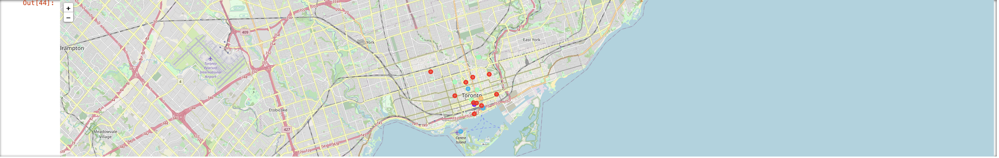

# Final Section of Capstone Project, Added Analysis

<b> Observing clusters of venues from different cluster labels

In [61]:
df1 = downtown_toronto_merged.loc[downtown_toronto_merged['Cluster Labels'] == 0, downtown_toronto_merged.columns[[1] + list(range(2, downtown_toronto_merged.shape[1]))]]
df1

,Postal Code,Neighbourhood,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
1,M4X,"St. James Town, Cabbagetown",43.667967,-79.367675,0,Restaurant,Café,Coffee Shop,Pub,Italian Restaurant,Pizza Place,Bakery,Indian Restaurant,Caribbean Restaurant,Pet Store
2,M4Y,Church and Wellesley,43.665860,-79.383160,0,Coffee Shop,Japanese Restaurant,Sushi Restaurant,Restaurant,Gay Bar,Hotel,Pub,Café,Men's Store,Mediterranean Restaurant
3,M5A,"Regent Park, Harbourfront",43.654260,-79.360636,0,Coffee Shop,Park,Bakery,Breakfast Spot,Café,Pub,Theater,Farmers Market,French Restaurant,Greek Restaurant
9,M5J,"Harbourfront East, Union Station, Toronto Islands",43.640816,-79.381752,0,Coffee Shop,Aquarium,Hotel,Café,Brewery,Restaurant,Fried Chicken Joint,Italian Restaurant,Scenic Lookout,Sporting Goods Shop
11,M5L,"Commerce Court, Victoria Hotel",43.648198,-79.379817,0,Coffee Shop,Restaurant,Hotel,Café,Gym,Italian Restaurant,Cocktail Bar,Seafood Restaurant,Japanese Restaurant,Deli / Bodega
13,M5T,"Kensington Market, Chinatown, Grange Park",43.653206,-79.400049,0,Café,Coffee Shop,Vietnamese Restaurant,Mexican Restaurant,Vegetarian / Vegan Restaurant,Bar,Grocery Store,Burger Joint,Park,Farmers Market
15,M5W,Stn A PO Boxes,43.646435,-79.374846,0,Coffee Shop,Seafood Restaurant,Café,Japanese Restaurant,Italian Restaurant,Cocktail Bar,Bakery,Restaurant,Hotel,Beer Bar
16,M5X,"First Canadian Place, Underground city",43.648429,-79.382280,0,Coffee Shop,Café,Restaurant,Hotel,Gym,Japanese Restaurant,Salad Place,Seafood Restaurant,Asian Restaurant,Steakhouse
17,M6G,Christie,43.669542,-79.422564,0,Grocery Store,Café,Park,Athletics & Sports,Candy Store,Italian Restaurant,Restaurant,Baby Store,Coffee Shop,Nightclub
18,M7A,"Queen's Park, Ontario Provincial Government",43.662301,-79.389494,0,Coffee Shop,Sushi Restaurant,Diner,Yoga Studio,College Auditorium,Smoothie Shop,Beer Bar,Sandwich Place,Burrito Place,Café


### This is a dataframe displaying the different common venues clustered by location and neighbourhood for anything with a cluster label of 0. Most common type of venue is a coffee shop

In [45]:
df2= downtown_toronto_merged.loc[downtown_toronto_merged['Cluster Labels'] == 1, downtown_toronto_merged.columns[[1] + list(range(2, downtown_toronto_merged.shape[1]))]]
df2

,Postal Code,Neighbourhood,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
10,M5K,"Toronto Dominion Centre, Design Exchange",43.647177,-79.381576,1,Coffee Shop,Hotel,Café,Restaurant,Salad Place,Seafood Restaurant,Bakery,Japanese Restaurant,Italian Restaurant,Deli / Bodega


### This is a dataframe displaying the different common venues clustered by location and neighbourhood for anything with a cluster label of 1. Most common type of venue is a coffee shop, but there are also hotels, restaurants, bakeries, etc.

In [46]:
df3= downtown_toronto_merged.loc[downtown_toronto_merged['Cluster Labels'] == 2, downtown_toronto_merged.columns[[1] + list(range(2, downtown_toronto_merged.shape[1]))]]
df3

,Postal Code,Neighbourhood,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
6,M5E,Berczy Park,43.644771,-79.373306,2,Coffee Shop,Cocktail Bar,Bakery,Cheese Shop,Seafood Restaurant,Beer Bar,Restaurant,Pharmacy,Farmers Market,Japanese Restaurant
7,M5G,Central Bay Street,43.657952,-79.387383,2,Coffee Shop,Italian Restaurant,Café,Sandwich Place,Salad Place,Thai Restaurant,Burger Joint,Bubble Tea Shop,Japanese Restaurant,Portuguese Restaurant
14,M5V,"CN Tower, King and Spadina, Railway Lands, Har...",43.628947,-79.394420,2,Airport Lounge,Airport Service,Airport Terminal,Boutique,Airport,Airport Food Court,Airport Gate,Sculpture Garden,Harbor / Marina,Boat or Ferry


### This is a dataframe displaying the different common venues clustered by location and neighbourhood for anything with a cluster label of 2. Most common type of venue is a coffee shop, but there are also hotels, restaurants, bakeries, etc.

In [47]:
df4= downtown_toronto_merged.loc[downtown_toronto_merged['Cluster Labels'] == 3, downtown_toronto_merged.columns[[1] + list(range(2, downtown_toronto_merged.shape[1]))]]
df4

,Postal Code,Neighbourhood,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,M4W,Rosedale,43.679563,-79.377529,3,Park,Playground,Trail,Department Store,Electronics Store,Eastern European Restaurant,Dumpling Restaurant,Donut Shop,Doner Restaurant,Dog Run
4,M5B,"Garden District, Ryerson",43.657162,-79.378937,3,Clothing Store,Coffee Shop,Bubble Tea Shop,Middle Eastern Restaurant,Japanese Restaurant,Italian Restaurant,Cosmetics Shop,Hotel,Café,Theater
8,M5H,"Richmond, Adelaide, King",43.650571,-79.384568,3,Coffee Shop,Café,Restaurant,Clothing Store,Bakery,Hotel,Thai Restaurant,Gym,Deli / Bodega,Sushi Restaurant
12,M5S,"University of Toronto, Harbord",43.662696,-79.400049,3,Café,Bookstore,Yoga Studio,Bakery,Japanese Restaurant,Bar,College Gym,College Arts Building,Bank,Italian Restaurant


### This is a dataframe displaying the different common venues clustered by location and neighbourhood for anything with a cluster label of 3. Most common types of venues here would be coffee shops and cafe's, with parks/trails following closely.

In [48]:
df5= downtown_toronto_merged.loc[downtown_toronto_merged['Cluster Labels'] == 4, downtown_toronto_merged.columns[[1] + list(range(1, downtown_toronto_merged.shape[1]))]]
df5

,Postal Code,Postal Code,Neighbourhood,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
5,M5C,M5C,St. James Town,43.651494,-79.375418,4,Café,Coffee Shop,Gastropub,Cocktail Bar,Creperie,Art Gallery,Cosmetics Shop,Seafood Restaurant,Hotel,Restaurant


### This is a dataframe displaying the different common venues clustered by location and neighbourhood for anything with a cluster label of 4. Most common type of venues here would be cafes and coffee shops, with some gastropubs nearby as well.